In [12]:
import json 

In [14]:
with open(r'H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\public_training_set_release_2.1\annotations.json') as file:
    file = json.load(file)

In [15]:
file.keys()

dict_keys(['categories', 'info', 'images', 'annotations'])

In [26]:
print(file.keys())
print(file['images'][:2])
print(file['categories'][:2])
print(file['categories'][0].keys())
print(file['annotations'][:2])
print(file['annotations'][0].keys())

dict_keys(['categories', 'info', 'images', 'annotations'])
[{'id': 131094, 'file_name': '131094.jpg', 'width': 480, 'height': 480}, {'id': 131097, 'file_name': '131097.jpg', 'width': 391, 'height': 390}]
[{'id': 1565, 'name': 'bread-wholemeal', 'name_readable': 'Bread, wholemeal', 'supercategory': 'food'}, {'id': 2099, 'name': 'jam', 'name_readable': 'Jam', 'supercategory': 'food'}]
dict_keys(['id', 'name', 'name_readable', 'supercategory'])
[{'id': 184135, 'image_id': 131094, 'category_id': 1352, 'segmentation': [[115.0, 206.5, 98.0, 204.5, 74.5, 182.0, 65.0, 167.5, 47.5, 156.0, 39.5, 137.0, 39.5, 130.0, 51.0, 118.5, 62.00000000000001, 112.5, 76.0, 113.5, 121.5, 151.0, 130.5, 169.0, 131.5, 185.0, 128.5, 195.0]], 'area': 5059.0, 'bbox': [39.5, 39.5, 167.0, 92.0], 'iscrowd': 0}, {'id': 184136, 'image_id': 131094, 'category_id': 1893, 'segmentation': [[182.2599609375, 210.67999877929685, 58.6599609375, 227.4799987792969, 9.459960937500002, 229.8799987792969, 8.2599609375, 341.47999877929

In [34]:
# Example image_id or file_name to filter by
target_image_id = 131094  # Change this to the image ID you're interested in
target_file_name = '131094.jpg'  # Change this to the file name you're interested in

# Find image details based on image_id or file_name
image_details = None
for img in file['images']:
    if img['id'] == target_image_id or img['file_name'] == target_file_name:
        image_details = img
        break

# Print the details of the found image
if image_details:
    print("Image Details:")
    print(image_details)

    # Now let's print the annotations related to this image
    print("\nAnnotations for this Image:")
    for annotation in file['annotations']:
        if annotation['image_id'] == image_details['id']:
            print(annotation)
else:
    print("Image not found!")


Image Details:
{'id': 131094, 'file_name': '131094.jpg', 'width': 480, 'height': 480}

Annotations for this Image:
{'id': 184135, 'image_id': 131094, 'category_id': 1352, 'segmentation': [[115.0, 206.5, 98.0, 204.5, 74.5, 182.0, 65.0, 167.5, 47.5, 156.0, 39.5, 137.0, 39.5, 130.0, 51.0, 118.5, 62.00000000000001, 112.5, 76.0, 113.5, 121.5, 151.0, 130.5, 169.0, 131.5, 185.0, 128.5, 195.0]], 'area': 5059.0, 'bbox': [39.5, 39.5, 167.0, 92.0], 'iscrowd': 0}
{'id': 184136, 'image_id': 131094, 'category_id': 1893, 'segmentation': [[182.2599609375, 210.67999877929685, 58.6599609375, 227.4799987792969, 9.459960937500002, 229.8799987792969, 8.2599609375, 341.4799987792969, 14.2599609375, 375.07999877929694, 49.059960937499994, 355.87999877929684, 64.6599609375, 327.0799987792969, 93.4599609375, 307.8799987792969, 139.0599609375, 305.47999877929686, 178.65996093750002, 307.8799987792969, 195.4599609375, 303.0799987792969, 196.6599609375, 270.67999877929685, 182.2599609375, 232.27999877929685, 181.

In [36]:
category_mapping = {cat['id']: cat['name'] for cat in file['categories']}

# Print category name for each annotation
for annotation in file['annotations']:
    category_id = annotation['category_id']
    category_name = category_mapping.get(category_id, 'Unknown category')
    # print(f"Annotation ID: {annotation['id']} | Category: {category_name} | Bounding Box: {annotation['bbox']}")


## Convert to COCO datasets

In [17]:
import json
from collections import defaultdict

# Load the JSON dataset (example content shown above)
dataset = file
# Build mappings
image_to_annotations = defaultdict(list)
image_to_categories = defaultdict(set)
category_mapping = {cat["id"]: cat["name"] for cat in dataset["categories"]}

# Populate the mappings
for annotation in dataset["annotations"]:
    image_to_annotations[annotation["image_id"]].append(annotation["id"])
    image_to_categories[annotation["image_id"]].add(annotation["category_id"])

# Convert category sets to lists
image_to_categories = {image_id: list(categories) for image_id, categories in image_to_categories.items()}

# Result
result = {
    "image_to_annotations": dict(image_to_annotations),
    "category_mapping": category_mapping,
    "image_to_categories": image_to_categories
}

# Print results
print(json.dumps(result, indent=4))


{
    "image_to_annotations": {
        "131072": [
            184123,
            184983
        ],
        "131087": [
            184129
        ],
        "131088": [
            184986,
            184987
        ],
        "131094": [
            184135,
            184136,
            184138,
            184139,
            184988,
            184989
        ],
        "131096": [
            184140
        ],
        "131097": [
            185202,
            185203,
            185204
        ],
        "131098": [
            185205,
            185206
        ],
        "131099": [
            184143
        ],
        "131100": [
            185207,
            185208,
            185209,
            185210,
            185211
        ],
        "131101": [
            184148
        ],
        "131109": [
            184158,
            184239,
            184240
        ],
        "131110": [
            184160
        ],
        "131111": [
            184161
        ]

In [ ]:
print(json.dumps(result, indent=4))


# data loader

https://www.kaggle.com/code/sainikhileshreddy/how-to-use-the-dataset

https://www.kaggle.com/datasets/sainikhileshreddy/food-recognition-2022/data

In [2]:
!pip install hub
# !pip install Flask pandas dask[all] distributed imageio matplotlib scikit-image scikit-learn scipy sqlalchemy jsonschema pyyaml tifffile[all] h5py joblib pywavelets seaborn

!pip install pillow

Defaulting to user installation because normal site-packages is not writeable
  Using cached hub-3.0.1-py3-none-any.whl (1.4 kB)
  Using cached deeplake-3.9.34.tar.gz (630 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Using cached pathos-0.3.3-py3-none-any.whl (82 kB)
  Using cached humbug-0.3.2-py3-none-any.whl (15 kB)
     ------------------------------------- 134.8/134.8 kB 47.7 kB/s eta 0:00:00
  Using cached pox-0.3.5-py3-none-any.whl (29 kB)
  Using cached dill-0.3.9-py3-none-any.whl (119 kB)
  Using cached ppft-1.7.6.9-py3-none-any.whl (56 kB)
  Created wheel for deeplake: filename=deeplake-3.9.34-py3-none-any.whl size=755541 sha256=2d83f16534889f589be2284d14969a4a9fa6f0defd1135dd74df358a2c8733

In [3]:
import hub
import numpy as np
import matplotlib.pyplot as plt 
# import torch 
ds_train = hub.load(r'H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\archive (1)\hub\train')
ds_val = hub.load(r'H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\archive (1)\hub\val')
ds_test = hub.load(r'H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\archive (1)\hub\test')

C:\Users\pakor\AppData\Roaming\Python\Python310\site-packages\deeplake\util\check_latest_version.py:32: UserWarning: A newer version of deeplake (4.1.2) is available. It's recommended that you update to the latest version using `pip install -U deeplake`.
  warnings.warn(


H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\archive (1)\hub\train loaded successfully.

H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\archive (1)\hub\val loaded successfully.

H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\archive (1)\hub\test loaded successfully.



C:\Users\pakor\AppData\Roaming\Python\Python310\site-packages\deeplake\util\warnings.py:7: UserWarning: Checking out dataset in read only mode as another machine has locked this version for writing.
  warnings.warn(*args, **kwargs)

C:\Users\pakor\AppData\Roaming\Python\Python310\site-packages\deeplake\util\warnings.py:7: UserWarning: Checking out dataset in read only mode as another machine has locked this version for writing.
  warnings.warn(*args, **kwargs)

C:\Users\pakor\AppData\Roaming\Python\Python310\site-packages\deeplake\util\warnings.py:7: UserWarning: Checking out dataset in read only mode as another machine has locked this version for writing.
  warnings.warn(*args, **kwargs)



In [8]:
# import torch



In [4]:

# Lets first install hub
from IPython.display import clear_output
# !pip install hub
clear_output()

In [5]:
categories = ds_train.categories.info.class_names
ds_train.tensors

{'images': Tensor(key='images'),
 'images_meta': Tensor(key='images_meta'),
 'masks': Tensor(key='masks'),
 'boxes': Tensor(key='boxes'),
 'categories': Tensor(key='categories'),
 'super_categories': Tensor(key='super_categories'),
 'areas': Tensor(key='areas'),
 'iscrowds': Tensor(key='iscrowds')}

Category : cake-chocolate


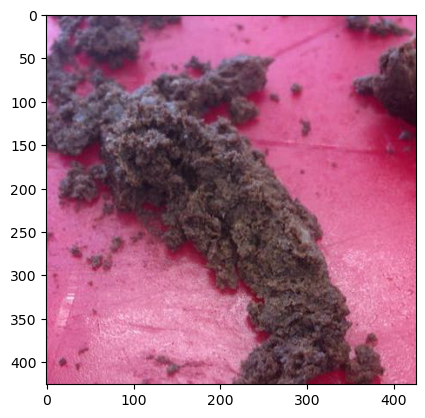

array([70166], dtype=uint32)

In [6]:
index = 0
image = ds_train['images'][index].numpy()
category_index = ds_train['categories'][index].numpy()[0]
print('Category : {0}'.format(categories[category_index]))
plt.imshow(image)
plt.show()
ds_train['areas'][0].numpy()

In [7]:
import hub
ds = hub.dataset(r'H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\archive (1)\hub\train')


H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\archive (1)\hub\train loaded successfully.



C:\Users\pakor\AppData\Roaming\Python\Python310\site-packages\deeplake\util\warnings.py:7: UserWarning: Checking out dataset in read only mode as another machine has locked this version for writing.
  warnings.warn(*args, **kwargs)



C:\Users\pakor\AppData\Roaming\Python\Python310\site-packages\deeplake\integrations\pytorch\common.py:138: UserWarning: Decode method for tensors ['images'] is defaulting to numpy. Please consider specifying a decode_method in .pytorch() that maximizes the data preprocessing speed based on your transformation.
  warnings.warn(


# MIS COCO to YOLO

In [51]:
import json
with open(r'H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\public_training_set_release_2.1\annotations.json') as file:
    file = json.load(file)

In [54]:
# file['categories']

In [55]:
import json
from collections import defaultdict

# Load the JSON dataset (example content shown above)
dataset = file
# Build mappings
image_to_annotations = defaultdict(list)
image_to_categories = defaultdict(set)
category_mapping = {cat["id"]: cat["name"] for cat in dataset["categories"]}

# Populate the mappings
for annotation in dataset["annotations"]:
    image_to_annotations[annotation["image_id"]].append(annotation["id"])
    image_to_categories[annotation["image_id"]].add(annotation["category_id"])

# Convert category sets to lists
image_to_categories = {image_id: list(categories) for image_id, categories in image_to_categories.items()}

# Result
result = {
    "image_to_annotations": dict(image_to_annotations),
    "category_mapping": category_mapping,
    "image_to_categories": image_to_categories
}
classes = set([val for key, val in category_mapping.items() ])
classes = {key: idx for idx , key in enumerate(classes)}
classes
# # Print results
# print(json.dumps(result, indent=4))


{'celeriac': 0,
 'latte_macchiato': 1,
 'pine_nuts': 2,
 'semi_hard_cheese': 3,
 'bread_ticino_ch': 4,
 'bell_pepper_red_raw': 5,
 'chickpeas': 6,
 'cheesecake': 7,
 'basil': 8,
 'hamburger': 9,
 'pineapple': 10,
 'hard_cheese': 11,
 'bread_whole_wheat': 12,
 'feta': 13,
 'banana_cake': 14,
 'asparagus': 15,
 'fish_n_s': 16,
 'meat_n_s': 17,
 'corn': 18,
 'aubergine_eggplant': 19,
 'vegetable_au_gratin_baked': 20,
 'green_olives': 21,
 'salmon_smoked': 22,
 'potato_salad': 23,
 'hazelnut_chocolate_spread_nutella_ovomaltine_caotina': 24,
 'potatoes_au_gratin_dauphinois_prepared': 25,
 'croissant_with_chocolate_filling': 26,
 'pistachio': 27,
 'raisins_dried': 28,
 'hazelnut': 29,
 'pasta_in_conch_form': 30,
 'chicken_cut_into_stripes_only_meat': 31,
 'almonds': 32,
 'salmon': 33,
 'salad_dressing': 34,
 'chicken_curry_cream_coconut_milk_curry_spices_paste': 35,
 'lentil_n_s': 36,
 'salad_lambs_ear': 37,
 'tuna_in_oil_drained': 38,
 'emmental_cheese_ch': 39,
 'mashed_potatoes_prepared_wi

In [44]:
category_mapping

{50: 'beetroot-steamed-without-addition-of-salt',
 101246: 'bread_wholemeal',
 100546: 'jam',
 101129: 'water',
 101243: 'bread',
 100133: 'banana',
 101306: 'soft_cheese',
 101126: 'ham_raw',
 101305: 'hard_cheese',
 100206: 'cottage_cheese',
 101178: 'coffee',
 101150: 'fruit_mixed',
 101185: 'pancake',
 101166: 'tea',
 100966: 'salmon_smoked',
 100078: 'avocado',
 100107: 'spring_onion_scallion',
 101181: 'ristretto_with_caffeine',
 101335: 'ham_n_s',
 100523: 'egg',
 101291: 'bacon',
 100063: 'chips_french_fries',
 101219: 'juice_apple',
 101308: 'chicken',
 100089: 'tomato',
 101183: 'broccoli',
 101279: 'shrimp_prawn',
 101188: 'carrot',
 101311: 'chickpeas',
 101214: 'french_salad_dressing',
 100321: 'pasta_hornli_ch',
 101275: 'sauce_cream',
 100319: 'pasta_n_s',
 100838: 'tomato_sauce',
 101302: 'cheese_n_s',
 101347: 'pear',
 100184: 'cashew_nut',
 100182: 'almonds',
 101282: 'lentil_n_s',
 101144: 'mixed_vegetables',
 100175: 'peanut_butter',
 100130: 'apple',
 100145: 'blue

In [43]:
len(list(category_mapping.keys()))    

323

In [56]:
class_name = category_mapping[101282]
classes[class_name]

36

In [1]:
# import json
# import os
# from collections import defaultdict

# # Create class mapping
# category_mapping = {cat["id"]: cat["name"] for cat in file["categories"]}
# classes = {name: idx for idx, name in enumerate(sorted(set(category_mapping.values())))}

# # Create image dimensions dictionary
# image_dimensions = {img['id']: (img['width'], img['height']) 
#                    for img in file['images']}

# # Convert annotations
# output_dir = 'validation-annotations'
# os.makedirs(output_dir, exist_ok=True)

# for annotation in file['annotations']:
#     image_id = annotation['image_id']
#     bbox = annotation['bbox']
#     category_id = annotation['category_id']
    
#     # Get class number using proper mapping
#     class_name = category_mapping[category_id]
#     class_no = classes[class_name]
#     # Get image dimensions
#     image_width, image_height = image_dimensions[image_id]
    
#     # Convert to YOLO format
#     x_center = (bbox[0] + bbox[2] / 2) / image_width
#     y_center = (bbox[1] + bbox[3] / 2) / image_height
#     width = bbox[2] / image_width
#     height = bbox[3] / image_height
    
#     # Write annotation
#     with open(f"{output_dir}/{image_id}.txt", "a") as f:
#         f.write(f"{class_no} {x_center} {y_center} {width} {height}\n")

# # Print class mapping for verification
# print(f"Total classes: {len(classes)}")
# print("\nFirst few class mappings:")
# for name, idx in list(classes.items())[:5]:
#     print(f"{name}: {idx}")

In [57]:
import os
import yaml

output_dir = 'validation-annotations'
invalid_files = []

for ann in os.listdir(output_dir):
    filepath = os.path.join(output_dir, ann)
    with open(filepath, 'r') as f:
        lines = f.readlines()
        for line in lines:
            class_num = int(line.split()[0])
            if int(class_num) > 323:
                print(class_num)
                

In [10]:
# all_annotation_categories = {annotation['category_id'] for annotation in file['annotations']}
# all_defined_categories = {category['id'] for category in file['categories']}

# extra_categories = all_annotation_categories - all_defined_categories
# missing_categories = all_defined_categories - all_annotation_categories

# print(f"Extra categories in annotations: {extra_categories}")
# print(f"Missing categories in annotations: {missing_categories}")


Extra categories in annotations: set()
Missing categories in annotations: set()


In [1]:
# import json

# # Load MS-COCO annotations
# with open(r'H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\public_training_set_release_2.1\annotations.json') as f:
#     coco_annotations = json.load(f)

# # Extract all class names
# class_names = [category['name'] for category in coco_annotations['categories']]

# # Create the dataset.yaml file
# yaml_content = f"""
# train: /path/to/train/images
# val: /path/to/val/images

# nc: {len(class_names)}  # Number of classes
# names: {class_names}  # List of class names
# """

# # Print the YAML content
# print(yaml_content)

# # Optionally, save to a file
# with open('dataset.yaml', 'w') as yaml_file:
#     yaml_file.write(yaml_content)


In [1]:
import pandas as pd 
import csv

train_df = pd.read_csv(r"H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\food-data\train_df.csv")
# val_df = pd.read_csv(r"H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\food-data\labels\val_df.csv")


In [2]:
# Assign class IDs
class_mapping = {name: idx for idx, name in enumerate(train_df['name'].unique())}
train_df['class_id'] = train_df['name'].map(class_mapping)
# val_df['class_id'] = val_df['name'].map(class_mapping)
# Function to convert bbox to YOLO format
def bbox_to_yolo(bbox, img_width, img_height):
    x_min, y_min, box_width, box_height = bbox
    x_center = (x_min + box_width / 2) / img_width
    y_center = (y_min + box_height / 2) / img_height
    width = box_width / img_width
    height = box_height / img_height
    return [x_center, y_center, width, height]


In [4]:
class_mapping.keys()

dict_keys(['soft-cheese', 'ham-raw', 'hard-cheese', 'bread-wholemeal', 'cottage-cheese', 'bread-half-white', 'fruit-salad', 'pancakes', 'salmon-smoked', 'avocado', 'spring-onion-scallion', 'emmental-cheese', 'cucumber', 'egg', 'bread-whole-wheat', 'butter', 'jam', 'bread', 'bread-white', 'caprese-salad-tomato-mozzarella', 'green-olives', 'tete-de-moine', 'salami', 'semi-hard-cheese', 'fresh-cheese', 'salad-leaf-salad-green', 'gruyere', 'coffee-with-caffeine', 'honey', 'bread-nut', 'blue-mould-cheese', 'cauliflower', 'bell-pepper-red-raw', 'walnut', 'sun-dried-tomatoe', 'red-cabbage', 'leaf-spinach', 'artichoke', 'mixed-vegetables', 'mashed-potatoes-prepared-with-full-fat-milk-with-butter', 'dried-meat', 'meat-terrine-pate', 'pecan-nut', 'apricot-dried', 'ham-cooked', 'cucumber-pickled', 'carrot-raw', 'mustard-dijon', 'bread-grain', 'rice', 'mixed-salad-chopped-without-sauce', 'broccoli', 'fennel', 'sauce-pesto', 'potatoes-steamed', 'onion', 'corn', 'focaccia', 'wienerli-swiss-sausage',

In [12]:
val_df.head()

,Unnamed: 0,file_name,name,bbox,width,height,class_id
0,0,149022.jpg,espresso-with-caffeine,"[77.5, 153.5, 136.5, 135.0]",455,455,243
1,1,149022.jpg,dark-chocolate,"[65.690625, 65.690625, 261.625, 261.625]",455,455,388
2,2,167905.jpg,espresso-with-caffeine,"[243.50000000000003, 243.50000000000003, 354.0...",781,781,243
3,3,121313.jpg,espresso-with-caffeine,"[64.5, 64.5, 113.5, 190.00000000000003]",392,391,243
4,4,153429.jpg,espresso-with-caffeine,"[97.5, 97.5, 227.0, 264.0]",464,464,243


In [18]:
import ast

# Convert the bbox column from string to list
train_df['bbox'] = train_df['bbox'].apply(ast.literal_eval)
val_df['bbox'] = val_df['bbox'].apply(ast.literal_eval)

# Apply YOLO conversion
train_df['yolo_bbox'] = train_df.apply(lambda row: bbox_to_yolo(row['bbox'], row['width'], row['height']), axis=1)
val_df['yolo_bbox'] = val_df.apply(lambda row: bbox_to_yolo(row['bbox'], row['width'], row['height']), axis=1)


In [19]:
train_df.head()

,Unnamed: 0,file_name,name,bbox,width,height,class_id,yolo_bbox
0,0,131094.jpg,soft-cheese,"[39.5, 39.5, 167.0, 92.0]",480,480,0,"[0.25625, 0.178125, 0.34791666666666665, 0.191..."
1,1,131094.jpg,ham-raw,"[8.2599609375, 8.2599609375, 366.8200378417969...",480,480,1,"[0.39931245803833015, 0.21345825195312498, 0.7..."
2,2,131094.jpg,hard-cheese,"[23.479998779296878, 86.25996093750001, 217.57...",480,480,2,"[0.2755624580383301, 0.340958251953125, 0.4532..."
3,3,131094.jpg,bread-wholemeal,"[239.4799987792969, 243.4599609375, 215.999999...",480,480,3,"[0.7239166641235352, 0.745958251953125, 0.4499..."
4,4,131094.jpg,cottage-cheese,"[127.87999877929687, 263.8599609375, 242.77996...",480,480,4,"[0.5193124580383301, 0.6609582519531251, 0.505..."


In [20]:
val_df.head()

,Unnamed: 0,file_name,name,bbox,width,height,class_id,yolo_bbox
0,0,149022.jpg,espresso-with-caffeine,"[77.5, 153.5, 136.5, 135.0]",455,455,243,"[0.32032967032967036, 0.4857142857142857, 0.3,..."
1,1,149022.jpg,dark-chocolate,"[65.690625, 65.690625, 261.625, 261.625]",455,455,388,"[0.431875, 0.431875, 0.575, 0.575]"
2,2,167905.jpg,espresso-with-caffeine,"[243.50000000000003, 243.50000000000003, 354.0...",781,781,243,"[0.5384122919334187, 0.5230473751600512, 0.453..."
3,3,121313.jpg,espresso-with-caffeine,"[64.5, 64.5, 113.5, 190.00000000000003]",392,391,243,"[0.3093112244897959, 0.4079283887468031, 0.289..."
4,4,153429.jpg,espresso-with-caffeine,"[97.5, 97.5, 227.0, 264.0]",464,464,243,"[0.4547413793103448, 0.49461206896551724, 0.48..."


In [22]:
import os

# Ensure the directory to store YOLO annotations exists
output_dir = r"H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\food-data\labels\train"
os.makedirs(output_dir, exist_ok=True)

# Iterate through each row in the dataframe
for _, row in train_df.iterrows():
    # Prepare the YOLO annotation string
    image_name = row['file_name']
    yolo_bbox = row['yolo_bbox']
    class_id = row['class_id']
    
    # Create a new annotation file for each image
    annotation_file = os.path.join(output_dir, f"{os.path.splitext(image_name)[0]}.txt")
    
    # Write the annotation to the file
    with open(annotation_file, 'a') as file:
        # YOLO format: <class_id> <x_center> <y_center> <width> <height>
        file.write(f"{class_id} {' '.join(map(str, yolo_bbox))}\n")


In [23]:
import os

# Ensure the directory to store YOLO annotations exists
output_dir = r"H:\FOOD-DETECTION\food-detection-and-nutritional-value\data\raw\food-data\labels\val"
os.makedirs(output_dir, exist_ok=True)

# Iterate through each row in the dataframe
for _, row in val_df.iterrows():
    # Prepare the YOLO annotation string
    image_name = row['file_name']
    yolo_bbox = row['yolo_bbox']
    class_id = row['class_id']
    
    # Create a new annotation file for each image
    annotation_file = os.path.join(output_dir, f"{os.path.splitext(image_name)[0]}.txt")
    
    # Write the annotation to the file
    with open(annotation_file, 'a') as file:
        # YOLO format: <class_id> <x_center> <y_center> <width> <height>
        file.write(f"{class_id} {' '.join(map(str, yolo_bbox))}\n")